### To run interactive plotly figures in the notebook, start in terminal with flag:
jupyter notebook --NotebookApp.iopub_data_rate_limit=10000000000

In [1]:
import make_dataset as data
import HBA_analysis as hba
import pandas as pd

In [2]:
%matplotlib inline

## Get the reference data:
There are 2 options:
- download the raw data from Allen (link) and process it using the script
    - requires additional data for reannotations (link)
- download the pre-processed data from Gdrive (may not be up to date)


In [3]:
exp = data.get_HBA_dataset(reannotate=True)

Processed HBA brain dataset found locally. Loading from ./data/processed/brainarea_vs_genes_exp_w_reannotations.tsv


In [4]:
exp

,CA1 field,CA2 field,CA3 field,CA4 field,"Crus I, lateral hemisphere","Crus I, paravermis","Crus II, lateral hemisphere","Crus II, paravermis",Edinger-Westphal nucleus,Heschl's gyrus,...,"temporal pole, inferior aspect","temporal pole, medial aspect","temporal pole, superior aspect",transverse gyri,trochlear nucleus,tuberomammillary nucleus,ventral tegmental area,ventromedial hypothalamic nucleus,vestibular nuclei,zona incerta
gene_symbol,,,,,,,,,,,,,,,,,,,,,
A1BG,0.856487,-1.773695,-0.678679,-0.986914,0.826986,0.948039,0.935427,1.120774,-1.018554,0.170282,...,0.277830,0.514923,0.733368,-0.104286,-0.910245,1.039610,-0.155167,-0.444398,-0.901361,-0.236790
A1BG-AS1,0.257664,-1.373085,-0.619923,-0.636275,0.362799,0.353296,0.422766,0.346853,-0.812015,0.903358,...,1.074116,0.821031,1.219272,0.901213,-1.522431,0.598719,-1.709745,-0.054156,-1.695843,-1.155961
A1CF,-0.089614,-0.546903,0.282914,-0.528926,0.507916,0.577696,0.647671,0.306824,0.089958,0.149820,...,-0.030265,-0.187367,-0.428358,-0.465863,-0.136936,1.229487,-0.110680,-0.118175,-0.139776,0.123829
A2M,0.552415,-0.635485,-0.954995,-0.259745,-1.687391,-1.756847,-1.640242,-1.733110,-0.091695,0.003428,...,-0.058505,0.207109,-0.161808,0.183630,0.948098,-0.977692,0.911896,-0.499357,1.469386,0.557998
A2ML1,0.758031,1.549857,1.262225,1.338780,-0.289888,-0.407026,-0.358798,-0.589988,0.944684,-0.466327,...,-0.472908,-0.598317,-0.247797,-0.282673,1.396365,0.945043,0.158202,0.572771,0.073088,-0.886780
A3GALT2,0.435751,1.125971,1.479726,0.010520,0.877256,0.617134,0.797456,0.724969,0.692655,-0.691691,...,-0.339939,-0.628313,-0.246285,0.049359,0.223667,1.164986,-0.102258,-0.849872,-0.354230,-0.421125
A4GALT,1.277084,0.710266,0.272435,0.452544,0.127867,-0.423357,0.222945,-0.453995,-0.919359,0.714507,...,0.100831,0.322003,0.622643,0.698657,0.060055,-1.546518,-0.578289,-1.117115,-0.442883,-0.352982
A4GNT,-0.330903,-0.477462,0.267584,-0.426862,0.223556,0.260993,0.632328,0.097173,-0.173487,-0.023084,...,0.555680,-0.462533,0.752745,0.648017,1.639433,0.353052,0.249200,0.934437,-0.165556,-0.715761
AAAS,-1.257280,-0.888406,-1.124108,-1.118677,1.234268,1.421483,1.429758,1.603573,-0.827011,-0.006078,...,0.073441,-0.372438,-0.564808,-0.011762,-0.351065,0.150541,-0.238958,-1.075925,-0.066461,0.145102


## Get your gene list of interest

In [5]:
deg_list = pd.read_csv('./data/gene_lists/deg_genelist.csv')

In [6]:
deg_list = deg_list.Symbol

In [7]:
print(deg_list.shape)
deg_list.head()

(361,)


0        TRPC6P
1    RNU6-1095P
2         THRSP
3        NUPR1L
4     RPL23AP69
Name: Symbol, dtype: object

## Generate a results table

In [8]:
results = hba.generate_stats_table(exp, gene_list=deg_list)

You submitted a gene list with 361 genes.
275 of those genes are present in the HBA dataset.
Genes not found in our reference data: ['TRPC6P' 'RNU6-1095P' 'RPL23AP69' 'CALML3-AS1' 'RN7SKP234' 'RNU6-476P'
 'MIR4458HG' 'ITM2BP1' 'RNA5SP323' 'RPSAP53' 'TPT1P10' 'MICF' 'TTC6'
 'CDC42-IT1' 'TIMM9P2' 'VTRNA1-3' 'RNA5SP195' 'ZSWIM5P2' 'PPIEL' 'OR7E12P'
 'MRPS31P2' 'PARP4P1' 'PSMD10P1' 'PGBD4P3' 'RNU6-703P' 'RPL21P43'
 'RNU6-125P' 'ACTG1P11' 'FAM27E4' 'RP4-747G18.5' 'GRIK1-AS1' 'RPL39P5'
 'OXCT1-AS1' 'CLRN1-AS1' 'ALMS1-IT1' 'LINC01123' 'UBE2Q2P6' 'MIR4712'
 'KRR1P1' 'LINC00441' 'HMGN2P30' 'VCAN-AS1' 'KCTD21-AS1' 'HOXB-AS2'
 'LINC00106' 'MRPL23-AS1' 'LINC01252' 'LMNTD2' 'FOXD4L1' 'C16orf47'
 'RNF144A-AS1' 'LDHAP7' 'KLF7-IT1' 'LURAP1L-AS1' 'LINC00565' 'C4orf50'
 'LINC00920' 'ARMC4P1' 'SLC9A7P1' 'OGFRP1' 'ERICH5' 'KRT8P50' 'MIR4435-2HG'
 'ADGRE4P' 'SNAI1P1' 'LINC01340' 'MTND4P24' 'SETP17' 'LDHAP3' 'PSPHP1'
 'LINC00941' 'NEFHP1' 'HCG24' 'CASC16' 'LMNTD1' 'RASGRF2-AS1' 'LINC01549'
 'ROR1-AS1' 'AGAP

In [9]:
# take a look at top 10 brain areas
top_10_brain_areas = results.head(10)
top_10_brain_areas

,raw p_values,corrected_p,AUC
lateral parabrachial nucleus,0.000016,0.000117,0.575688
superior colliculus,0.000028,0.000189,0.573451
abducens nucleus,0.000036,0.000236,0.572450
pontine raphe nucleus,0.000039,0.000249,0.572082
medial parabrachial nucleus,0.000040,0.000249,0.572008
ventral tegmental area,0.000116,0.000706,0.567559
superior olivary complex,0.000143,0.000845,0.566641
motor nucleus of trigeminal nerve,0.000146,0.000845,0.566562
vestibular nuclei,0.000163,0.000900,0.566074
facial motor nucleus,0.000172,0.000930,0.565827


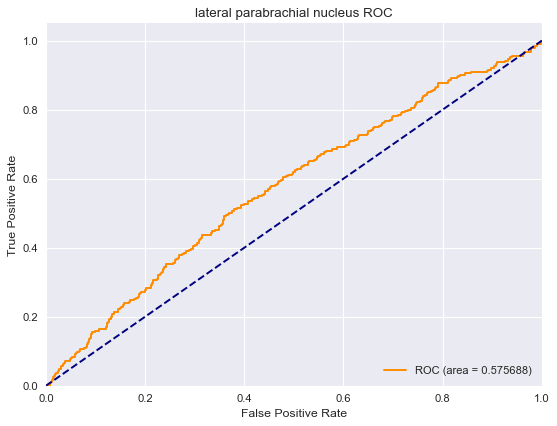

In [10]:
hba.make_ROC_plot(exp_df=exp, gene_list=deg_list, brain_area='lateral parabrachial nucleus')

## Compare the expression of the 2 distributions of genes

In [11]:
import plotly
plotly.offline.init_notebook_mode()

In [12]:
hba.interactive_distplot(exp_df=exp, brain_area='lateral parabrachial nucleus', disease_label='Anorexia', gene_list=deg_list)

## Generate a heatmap for multiple brain areas

In [13]:
from genometools.expression import ExpMatrix
from genometools.expression.cluster import bicluster
from plotly.offline import iplot
from plotly.offline.offline import _plot_html
import plotly.graph_objs as go

In [14]:
# get reference expression matrix, select the the genes that are in our gene list and cluster
expression = ExpMatrix.read_tsv('./data/processed/brainarea_vs_genes_exp_w_reannotations.tsv')
AN_exp = expression[expression.index.isin(deg_list)]
AN_exp = bicluster(AN_exp)

In [16]:
fig = AN_exp.loc[:, top_10_brain_areas.index].get_figure(
    height=800, width=900,
    emin=-3.0, emax=3.0,
    margin_bottom=100,
    heatmap_kw=dict(colorbar_label='Centered Expression<br>(log<sub>2</sub>-scale)'))
iplot(fig)